In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import math

from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import Normalizer
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

from keras.callbacks import EarlyStopping
from keras.layers.recurrent import LSTM
from keras.optimizers import Adam, Adagrad, Adadelta
from keras.layers.core import Dense, Activation, Dropout
from keras.models import Sequential
from keras import metrics

Using TensorFlow backend.


In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import math

In [2]:
def date_to_colunm(stock): 
    stock['Date'] = stock.index #sensex
    stock.index = stock['Date']
    stock.index = pd.to_datetime(stock.index) 
    stock.drop('Date', axis=1, inplace=True)
    
def get_data(stock):
    try:
        df = pd.read_csv(stock+'.csv')
        #df.dropna(axis=1, inplace=True) #sensex
        #df.rename(columns={'': 'Date', 'Date': 'Open', 'Open': 'High', 'High': 'Low', 'Low': 'Close'}, inplace=True) #sensex
        date_to_colunm(df)
        return df
    except IOError:
        print('Não existe o arquivo ')
        return
   
    
def n_moving_avg(stock_colunm, n=10):
    return stock_colunm.rolling(n).mean()

def w_moving_avg(values, n=10):
    weight = np.exp(np.linspace(-1., 0., n))
    weight /= weight.sum()
    wma = np.convolve(values, weight)[:len(values)]
    wma[:n-1] = np.nan
    
    return wma 
    
#def exp_moving_avg(stock_colunm, n=10):
#    return stock_colunm.ewm(span=n).mean()[n-1:]
    
    
def rsi(stock, n=14):
    delta = stock['Close'].diff()
    
    dUp, dDown = delta.copy(), delta.copy()
    dUp[dUp < 0] = 0
    dDown[dDown > 0] = 0
    dDown = dDown.abs()
    
    RolUp = dUp.ewm(com=n).mean()[n-1:]
    RolDown = dDown.ewm(com=n).mean()[n-1:]
    
    #RolUp = dUp.rolling(n).mean()
    #RolDown = dDown.rolling(n).mean()
    
    RS = RolUp / RolDown
    
    rsi = 100.0 - (100.0 / (1.0 + RS))
    stock['RSI'] = rsi

def momentum(stock, n=10):
    stock['Momentum'] = stock['Close'].diff(n-1)
    
def stc_k_d(stock, n=14):
    stock['Stc_k'] = ((stock['Close'] - \
                     stock['Low'].rolling(window=n).min()) / \
                     (stock['High'].rolling(window=n).max() - \
                     stock['Low'].rolling(window=n).min())) * 100.0
    stock['Stc_d'] = stock['Stc_k'].rolling(3).mean()
#def momentum(stock, n=10):
    #stock['Momentum'] = stock['Close'].rolling_apply(lambda x: x - stock['Close'][])

def macd_f(stock, x=12, y=26, z=9):
    macd = stock['Close'].ewm(span=x).mean()[x-1:] - \
           stock['Close'].ewm(span=y).mean()[y-1:]
    #macd.ewm(span=z).mean()[z-1:] #macd - macd.ewm(span=z).mean()
    stock['MACD'] = macd.rolling(z).mean()

def acc_dist(stock):
    ar = np.zeros(stock.shape[0])
    i = 1
    while i < stock.shape[0]:
        ar[i] = (stock['High'][i] - stock['Close'][i-1]) / \
                   (stock['High'][i] - stock['Low'][i])
        i += 1
    stock['Acc_Dist'] = ar

def acc_dist2(stock):
    # A/D(i) =((CLOSE(i) - LOW(i)) - (HIGH(i) - CLOSE(i)) * VOLUME(i) / (HIGH(i) - LOW(i)) + A/D(i-1)
    
    #for i in stock.iterrows():
    #    acc_dist = ((i[1][3] - i[1][2]) - \
    #                (i[1][1] - i[1][3])) * i[1][4] / \
    #                ((i[1][1] - i[1][2]) + array[-1])
    #    array.append(acc_dist)
    
    #ad_ar = np.zeros(stock.shape[0], dtype=np.double64)
    ad_ar = []
    i = 0
    money_flow = ((stock['Close'][i] - stock['Low'][i]) - \
                      (stock['High'][i] - stock['Close'][i])) / \
                      (stock['High'][i] - stock['Low'][i])
    money_flow_v = money_flow * stock['Volume'][i]
    acc_dist = money_flow_v
    ad_ar.append(acc_dist)
    i += 1
    while i < stock.shape[0]:
        money_flow = ((stock['Close'][i] - stock['Low'][i]) - \
                      (stock['High'][i] - stock['Close'][i])) / \
                      (stock['High'][i] - stock['Low'][i])
        money_flow_v = money_flow * stock['Volume'][i]
        acc_dist = ad_ar[-1] + money_flow_v
        ad_ar.append(acc_dist)
        i += 1;
    print(min(ad_ar))
    #np_array = np.array(array[1:])
    #del array
    #stock['Acc_Dist'] = np_array

def cci(stock, n=20):
    typ_price = (stock['High'] + stock['Low'] + stock['Close']) / 3
    sma_tp_20 = typ_price.rolling(n).mean()
    i = n
    MDar = []
    cci = np.zeros_like(sma_tp_20)
    while i <= len(typ_price):
        considtp = typ_price[i-n:i]
        consid_smatp = sma_tp_20[i-1]
        Mds = 0
        j = 0
        while j < len(considtp):
            curMd = abs(considtp[j] - consid_smatp)
            Mds += curMd
            j += 1
        Mds = Mds/n
        MDar.append(Mds)
        i += 1
    
    ii = n
    while ii < len(sma_tp_20):
        cci[ii] = (typ_price[ii-1] - sma_tp_20[ii-1]) / (0.015 * MDar[ii-n])
        ii += 1
    cci[cci == 0] = np.nan
    stock['CCI'] = cci

def lw_r(stock, n=14):
    #(Highest High - Lowest Low) * -100
    #while i < stock.shape[0]:
    value = (stock['High'].rolling(n).max() - stock['Close'][n:]) / \
            (stock['High'].rolling(n).max() - stock['Low'].rolling(n).min()) * \
            -100.0
    stock['R%'] = value
    
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean((np.abs(y_true - y_pred) / y_true)) * 100


In [3]:
stock = '^BVSP'

if stock == 'SENSEX':
    df = get_data(stock)
else:
    df = get_data(stock)
    df = df.drop('Adj Close', axis=1) #se tiver adj close
    df = df.drop('Volume', axis=1) #se tiver volume

In [4]:
df = df[df['High'] != df['Low']] #yahoo
df = df[df['Open'] != 'null'] #yahoo
df.Open = pd.to_numeric(df.Open) #yahoo
df.High = pd.to_numeric(df.High)
df.Low = pd.to_numeric(df.Low)
df.Close = pd.to_numeric(df.Close)

In [5]:
        ############# economic indicators ##############
rsi(df)
df['SMA-10'] = n_moving_avg(df['Close'], n=10)
df['WMA'] = w_moving_avg(np.array(df['Close']))
momentum(df)
stc_k_d(df)
macd_f(df)
acc_dist(df)
cci(df, n=30)
lw_r(df)

df.dropna(axis=0, how='any', inplace=True)

1 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0454     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0039     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0025     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0020     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0012        
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0011     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0011     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 9.8254e-04     


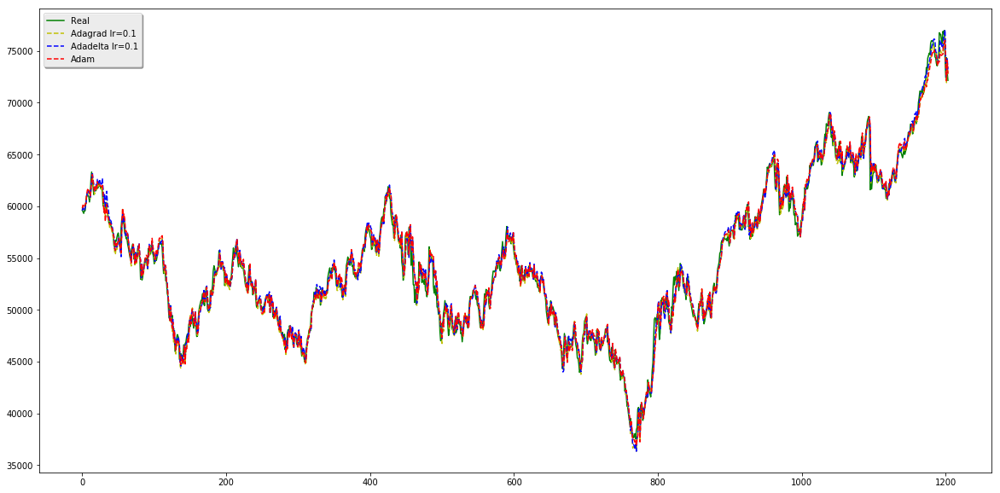

2 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0927     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0054     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0034     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0027     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0023     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0021     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0018     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0017     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch 1

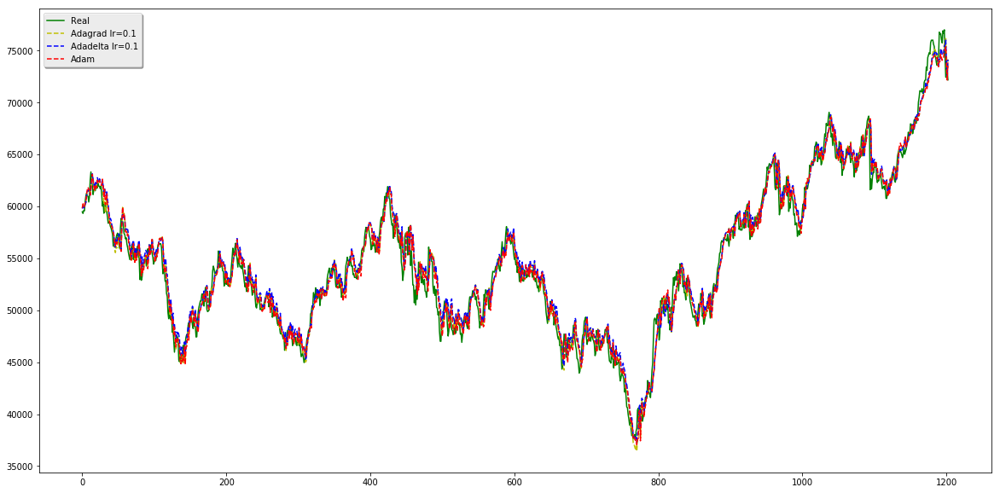

3 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0975     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0046     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0031     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0024     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0020     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0016       
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0015     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch

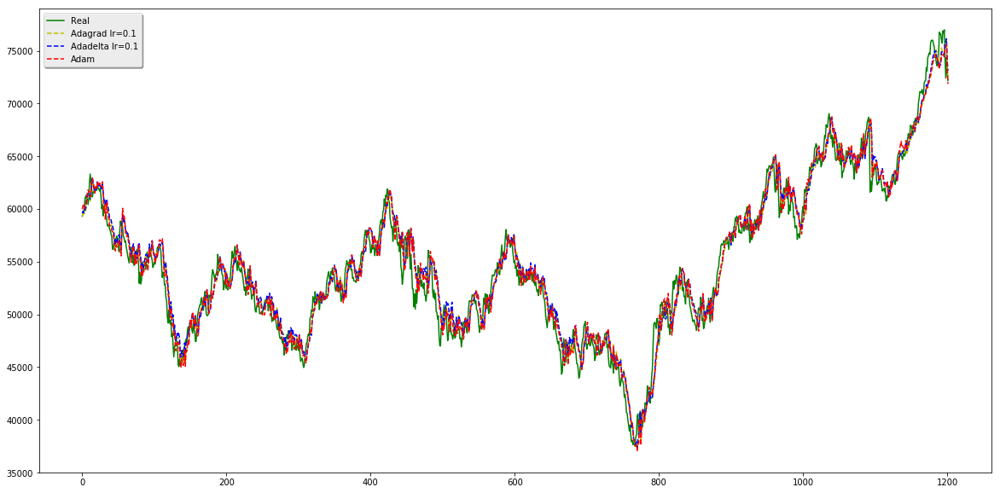

4 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0708     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0042     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0039     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0024     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0021     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0018     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0015     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0011       
Epoch

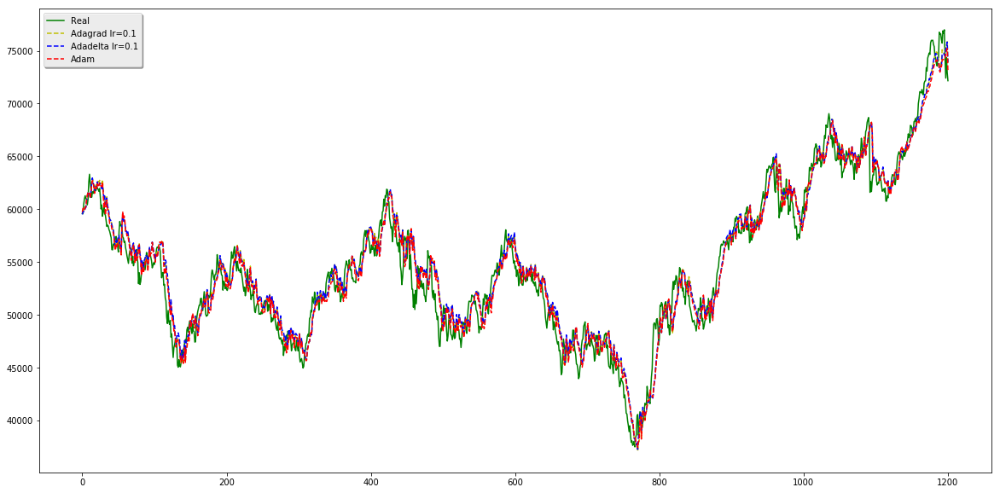

5 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0673     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0039     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0032     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0023     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0017     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0011     
Epoch 1

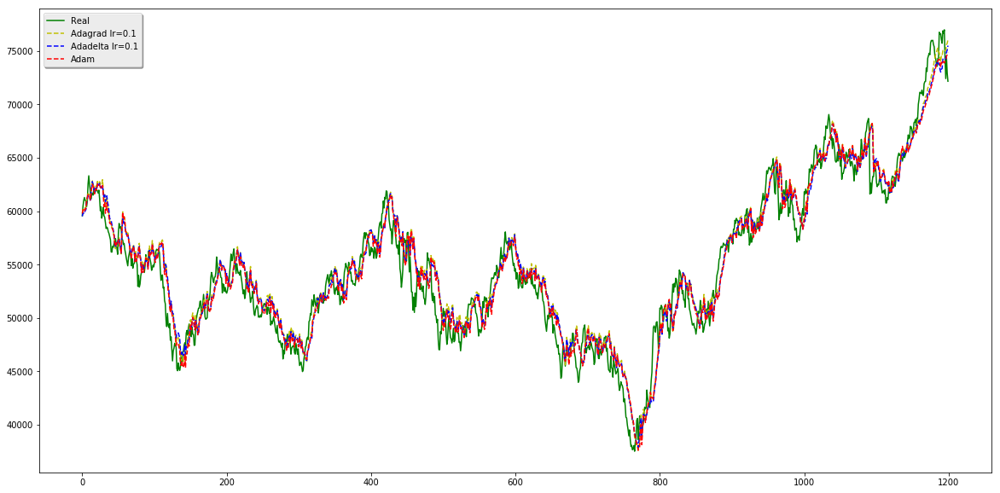

6 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0569     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0041     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0028     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0021     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0018     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0017     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch 1

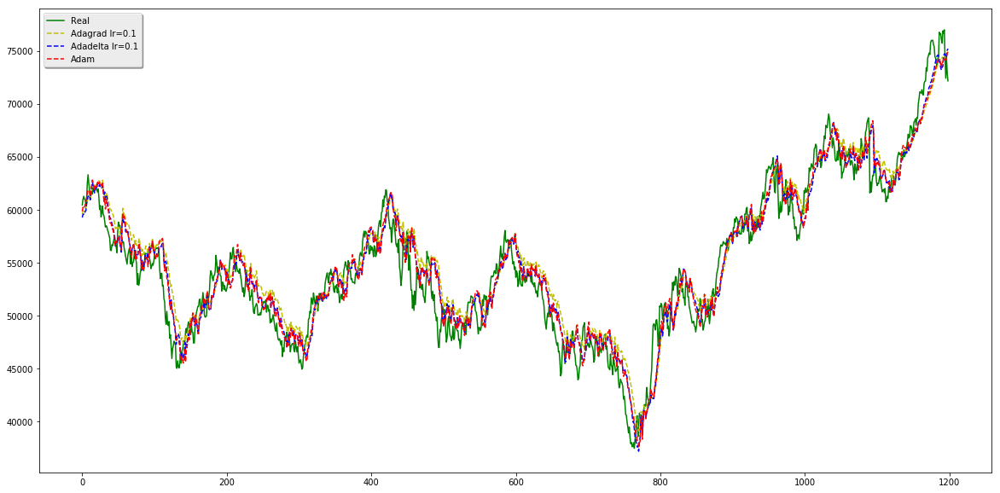

7 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0857     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0045     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0032     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0026     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0027     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0015     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch 1

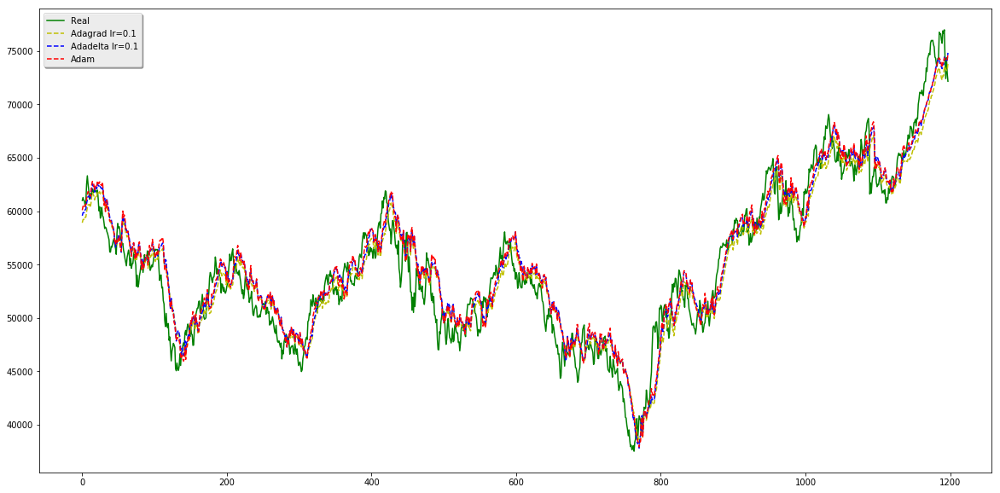

8 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0844     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0048     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0033     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0045     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0023     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0017     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0015     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0011     
Epoch 1

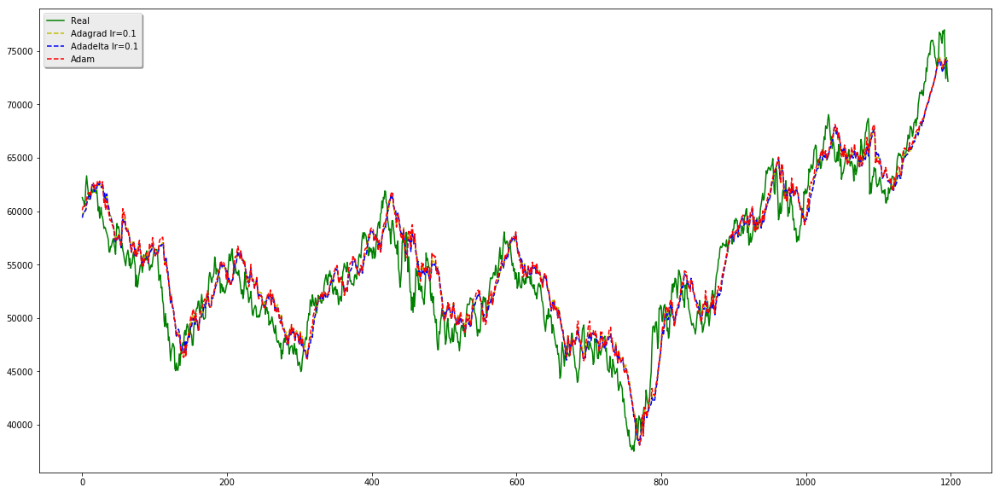

9 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0594     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0038     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0025     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0021     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0016     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0015     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 0.0011       
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 0.0011     
Epoch

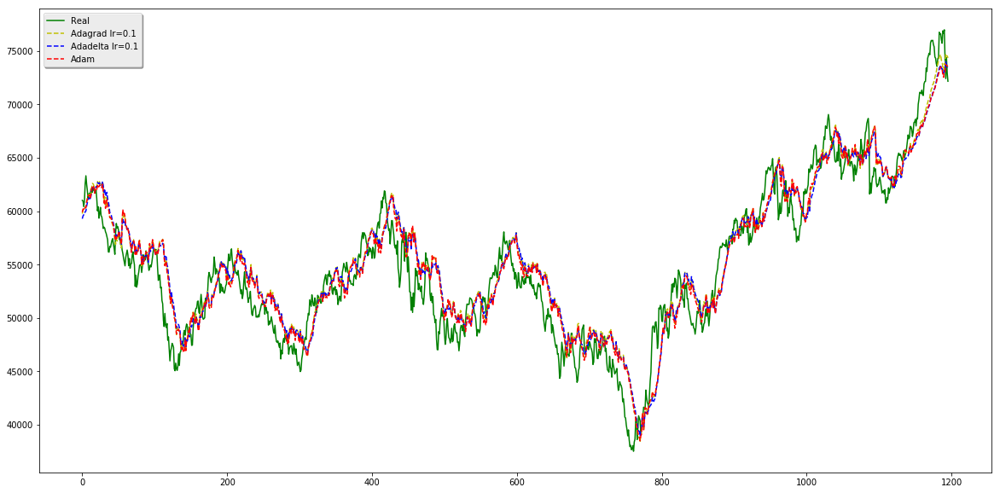

10 dia(s) a frente
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0529     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0034     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0024     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0018     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0015     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0013     
Epoch 8/2000
3618/3618 [==============================] - 0s - loss: 0.0012     
Epoch 9/2000
3618/3618 [==============================] - 0s - loss: 9.9326e-04     
Epoch 10/2000
3618/3618 [==============================] - 0s - loss: 0.0011     
Epoch 11/2000
3618/3618 [==============================] - 0s - loss: 9.5324e-04     
Epoch 12/2000
3618/3618 [==============================] - 0s - loss: 8.9939e-04

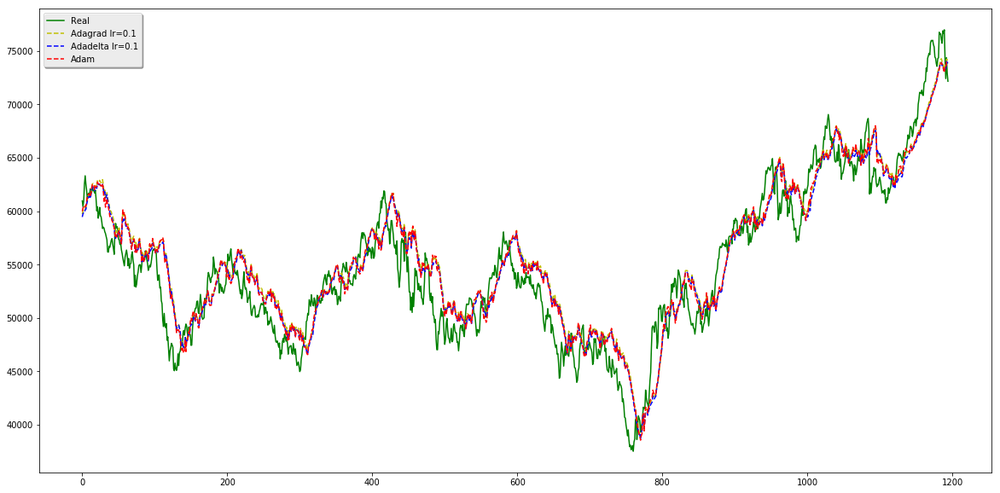

{'gamma': 0.001, 'C': 5, 'epsilon': 1e-08}
{'gamma': 0.01, 'C': 100, 'epsilon': 1e-08}
{'gamma': 0.01, 'C': 100, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 10, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.01, 'C': 10, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0520     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0032     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0024     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0022     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0014     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0017     


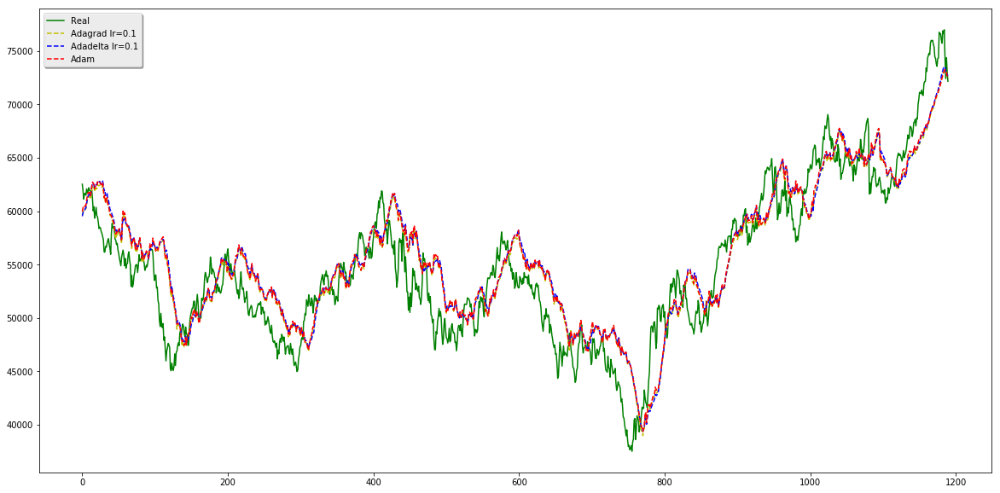

{'gamma': 0.001, 'C': 5, 'epsilon': 1e-08}
{'gamma': 0.01, 'C': 100, 'epsilon': 1e-08}
{'gamma': 0.01, 'C': 100, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 10, 'epsilon': 1e-08}
{'gamma': 0.01, 'C': 50, 'epsilon': 1e-08}
{'gamma': 0.001, 'C': 1, 'epsilon': 1e-08}
Epoch 1/2000
3618/3618 [==============================] - 0s - loss: 0.0625     
Epoch 2/2000
3618/3618 [==============================] - 0s - loss: 0.0048     
Epoch 3/2000
3618/3618 [==============================] - 0s - loss: 0.0030     
Epoch 4/2000
3618/3618 [==============================] - 0s - loss: 0.0024     
Epoch 5/2000
3618/3618 [==============================] - 0s - loss: 0.0022     
Epoch 6/2000
3618/3618 [==============================] - 0s - loss: 0.0019     
Epoch 7/2000
3618/3618 [==============================] - 0s - loss: 0.0016     


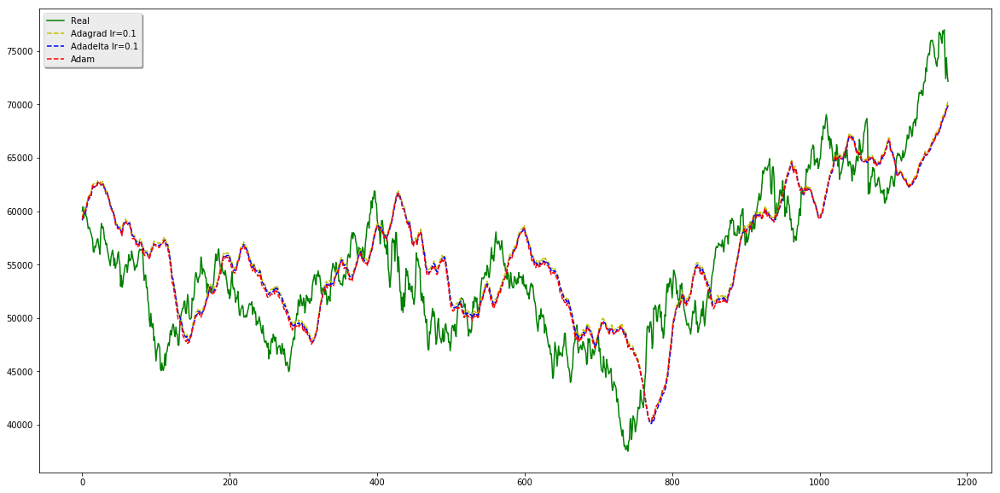

In [48]:
results = []
my_opt = Adagrad(lr=0.1)
my_opt2 = Adadelta(lr=0.1)
my_opt3 = Adam()

corr1 = []
corr2 = []
corr3 = []

for it in range(12):
    j = 0
    if(it<10):
        j=it+1
        print(str(j)+' dia(s) a frente')
        X = df.values[:, 4:]
        y = df.values[:, 3]

        n_days_ahead = j #prever n dias a frente
        tuning_set = int(X.shape[0]*0.2) 
        tuning_train_set = int(tuning_set*0.8)
        
        #fitting on data
        y = y.reshape(-1,1)
        sc = StandardScaler()
        X = sc.fit_transform(X, y)
        y = sc.fit_transform(y, X)
        
        X_train, X_test = X[tuning_set - n_days_ahead:X.shape[0]-tuning_set], X[X.shape[0]-tuning_set:-n_days_ahead] #treino 80% teste 20%
        y_train, y_test = y[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead], y[(X.shape[0]-tuning_set)+n_days_ahead:]

        attr={'C': [1, 2, 5, 10, 25, 50, 100],
              'gamma': [1e-2, 1e-3],
              'epsilon': [1e-8]
             }

        test_attr = []
        for i in range(X.shape[1]):
            svr_model = SVR()
            svr_cv = GridSearchCV(svr_model, attr, cv=5)
            svr_cv.fit(X[tuning_set - n_days_ahead:X.shape[0]-tuning_set,i].reshape(-1,1),
                       X[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead,i])
            test_attr.append(svr_cv.predict(X[X.shape[0]-tuning_set:-n_days_ahead, i].reshape(-1,1)))
        
        test_attr = np.array(test_attr)
        test_attr = test_attr.transpose()
        
        #colocar epoch 2000
        
        model = Sequential()
        model.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model.add(Dense(1))
        model.compile(optimizer=my_opt, loss='mse')
        model.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        model2 = Sequential()
        model2.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model2.add(Dense(1))
        model2.compile(optimizer=my_opt2, loss='mse')
        model2.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        model3 = Sequential()
        model3.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model3.add(Dense(1))
        model3.compile(optimizer=my_opt3, loss='mse')
        model3.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        y_pred = model.predict(test_attr)
        y_pred2 = model2.predict(test_attr)
        y_pred3 = model3.predict(test_attr)
        
        y_pred = sc.inverse_transform(y_pred)
        y_pred2 = sc.inverse_transform(y_pred2)
        y_pred3 = sc.inverse_transform(y_pred3)
        
        y_test = sc.inverse_transform(y[(X.shape[0]-tuning_set)+n_days_ahead:])
        
        
        with open(stock+'_resultados_novo.txt','a') as arq:
            arq.write('Adagrad lr=0.1 - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred)) + '\n')
            arq.write('Adadelta lr=0.1 - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred2)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred2)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred2)) + '\n')
            arq.write('Adam - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred3)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred3)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred3)) + '\n')
        
        corr1.append(np.corrcoef(y_pred.reshape(-1,1)[:,0], y_test[:,0]))
        corr2.append(np.corrcoef(y_pred2.reshape(-1,1)[:,0], y_test[:,0]))
        corr3.append(np.corrcoef(y_pred3.reshape(-1,1)[:,0], y_test[:,0]))
        
        plt.figure(figsize=(20,10))
        plot_real = plt.plot(range(0,y_test.shape[0]), y_test, c='g', label='Real')
        plot_pred = plt.plot(range(0,y_test.shape[0]), y_pred, c='y', ls='--', label='Adagrad lr=0.1')
        plot_pred2 = plt.plot(range(0,y_test.shape[0]), y_pred2, c='b',  ls='--', label='Adadelta lr=0.1')
        plot_pred3 = plt.plot(range(0,y_test.shape[0]), y_pred3, c='r',  ls='--', label='Adam')
        legend = plt.legend(loc='upper left', shadow=True)
        plt.savefig(stock+' plot_dia '+str(j)+'.png')              
        plt.show()
        
    elif it==10:
        j=15
        #X = df.iloc[:, 6:]
        X = df.values[:, 4:]
        y = df.values[:, 3]

        n_days_ahead = j #prever n dias a frente
        tuning_set = int(X.shape[0]*0.2) 
        tuning_train_set = int(tuning_set*0.8)
        
        #fitting on data
        y = y.reshape(-1,1)
        sc = StandardScaler()
        X = sc.fit_transform(X, y)
        y = sc.fit_transform(y, X)
        
        X_train, X_test = X[tuning_set - n_days_ahead:X.shape[0]-tuning_set], X[X.shape[0]-tuning_set:-n_days_ahead] #treino 80% teste 20%
        y_train, y_test = y[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead], y[(X.shape[0]-tuning_set)+n_days_ahead:]
        
        attr={'C': [1, 2, 5, 10, 25, 50, 100],
              'gamma': [1e-2, 1e-3],
              'epsilon': [1e-8]
             }

        test_attr = []
        for i in range(X.shape[1]):
            svr_model = SVR()
            svr_cv = GridSearchCV(svr_model, attr, cv=5)
            svr_cv.fit(X[tuning_set - n_days_ahead:X.shape[0]-tuning_set,i].reshape(-1,1),
                       X[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead,i])
            print(svr_cv.best_params_)
            test_attr.append(svr_cv.predict(X[X.shape[0]-tuning_set:-n_days_ahead, i].reshape(-1,1)))
        
        test_attr = np.array(test_attr)
        test_attr = test_attr.transpose()
        
    
        model = Sequential()
        model.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model.add(Dense(1))
        model.compile(optimizer=my_opt, loss='mse')
        model.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        model2 = Sequential()
        model2.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model2.add(Dense(1))
        model2.compile(optimizer=my_opt2, loss='mse')
        model2.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        model3 = Sequential()
        model3.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model3.add(Dense(1))
        model3.compile(optimizer=my_opt3, loss='mse')
        model3.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        y_pred = model.predict(test_attr)
        y_pred2 = model2.predict(test_attr)
        y_pred3 = model3.predict(test_attr)
        
        y_pred = sc.inverse_transform(y_pred)
        y_pred2 = sc.inverse_transform(y_pred2)
        y_pred3 = sc.inverse_transform(y_pred3)
        
        y_test = sc.inverse_transform(y[(X.shape[0]-tuning_set)+n_days_ahead:])
        
        
        with open(stock+'_resultados_novo.txt','a') as arq:
            arq.write('Adagrad lr=0.1 - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred)) + '\n')
            arq.write('Adadelta lr=0.1 - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred2)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred2)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred2)) + '\n')
            arq.write('Adam - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred3)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred3)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred3)) + '\n')
        
        corr1.append(np.corrcoef(y_pred.reshape(-1,1)[:,0], y_test[:,0]))
        corr2.append(np.corrcoef(y_pred2.reshape(-1,1)[:,0], y_test[:,0]))
        corr3.append(np.corrcoef(y_pred3.reshape(-1,1)[:,0], y_test[:,0]))
        
        plt.figure(figsize=(20,10))
        plot_real = plt.plot(range(0,y_test.shape[0]), y_test, c='g', label='Real')
        plot_pred = plt.plot(range(0,y_test.shape[0]), y_pred, c='y', ls='--', label='Adagrad lr=0.1')
        plot_pred2 = plt.plot(range(0,y_test.shape[0]), y_pred2, c='b',  ls='--', label='Adadelta lr=0.1')
        plot_pred3 = plt.plot(range(0,y_test.shape[0]), y_pred3, c='r',  ls='--', label='Adam')
        legend = plt.legend(loc='upper left', shadow=True)
        plt.savefig(stock+' plot_dia '+str(j)+'.png')              
        plt.show()
        
    else:
        j=30
        #X = df.iloc[:, 6:]
        X = df.values[:, 4:]
        y = df.values[:, 3]

        n_days_ahead = j #prever n dias a frente
        tuning_set = int(X.shape[0]*0.2) 
        tuning_train_set = int(tuning_set*0.8)
        
        #fitting on data
        y = y.reshape(-1,1)
        sc = StandardScaler()
        X = sc.fit_transform(X, y)
        y = sc.fit_transform(y, X)
        
        X_train, X_test = X[tuning_set - n_days_ahead:X.shape[0]-tuning_set], X[X.shape[0]-tuning_set:-n_days_ahead] #treino 80% teste 20%
        y_train, y_test = y[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead], y[(X.shape[0]-tuning_set)+n_days_ahead:]
        
        attr={'C': [1, 2, 5, 10, 25, 50, 100],
              'gamma': [1e-2, 1e-3],
              'epsilon': [1e-8]
             }

        test_attr = []
        for i in range(X.shape[1]):
            svr_model = SVR()
            svr_cv = GridSearchCV(svr_model, attr, cv=5)
            svr_cv.fit(X[tuning_set - n_days_ahead:X.shape[0]-tuning_set,i].reshape(-1,1),
                       X[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead,i])
            print(svr_cv.best_params_)
            test_attr.append(svr_cv.predict(X[X.shape[0]-tuning_set:-n_days_ahead, i].reshape(-1,1)))
        
        test_attr = np.array(test_attr)
        test_attr = test_attr.transpose()
        
        model = Sequential()
        model.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model.add(Dense(1))
        model.compile(optimizer=my_opt, loss='mse')
        model.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        model2 = Sequential()
        model2.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model2.add(Dense(1))
        model2.compile(optimizer=my_opt2, loss='mse')
        model2.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        model3 = Sequential()
        model3.add(Dense(30, activation='tanh', input_shape=(X.shape[1],)))
        model3.add(Dense(1))
        model3.compile(optimizer=my_opt3, loss='mse')
        model3.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)
        
        y_pred = model.predict(test_attr)
        y_pred2 = model2.predict(test_attr)
        y_pred3 = model3.predict(test_attr)
        
        y_pred = sc.inverse_transform(y_pred)
        y_pred2 = sc.inverse_transform(y_pred2)
        y_pred3 = sc.inverse_transform(y_pred3)
        
        y_test = sc.inverse_transform(y[(X.shape[0]-tuning_set)+n_days_ahead:])
        
        
        with open(stock+'_resultados_novo.txt','a') as arq:
            arq.write('Adagrad lr=0.1 - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred)) + '\n')
            arq.write('Adadelta lr=0.1 - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred2)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred2)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred2)) + '\n')
            arq.write('Adam - '+str(j)+' dia \n' + 
                     ' MSE = '+str(mean_squared_error(y_test, y_pred3)) + \
                     ' MAE = '+str(mean_absolute_error(y_test, y_pred3)) + \
                     ' MAPE = '+str(mean_absolute_percentage_error(y_test, y_pred3)) + '\n')
        
        corr1.append(np.corrcoef(y_pred.reshape(-1,1)[:,0], y_test[:,0]))
        corr2.append(np.corrcoef(y_pred2.reshape(-1,1)[:,0], y_test[:,0]))
        corr3.append(np.corrcoef(y_pred3.reshape(-1,1)[:,0], y_test[:,0]))
        
        plt.figure(figsize=(20,10))
        plot_real = plt.plot(range(0,y_test.shape[0]), y_test, c='g', label='Real')
        plot_pred = plt.plot(range(0,y_test.shape[0]), y_pred, c='y', ls='--', label='Adagrad lr=0.1')
        plot_pred2 = plt.plot(range(0,y_test.shape[0]), y_pred2, c='b',  ls='--', label='Adadelta lr=0.1')
        plot_pred3 = plt.plot(range(0,y_test.shape[0]), y_pred3, c='r',  ls='--', label='Adam')
        legend = plt.legend(loc='upper left', shadow=True)
        plt.savefig(stock+' plot_dia '+str(j)+'.png')              
        plt.show()
        

In [63]:
for corr in corr2:
    print(corr[0][1])
print('-----------\n')
for corr in corr3:
    print(corr[0][1])

In [82]:
af1 = []
for corr in corr1:
    af1.append(corr[0][1])
af1 = np.array(af1)

In [80]:
af2 = []
for corr in corr2:
    af2.append(corr[0][1])
af2 = np.array(af2)

In [79]:
af3 = []
for corr in corr3:
    af3.append(corr[0][1])
af3 = np.array(af3)

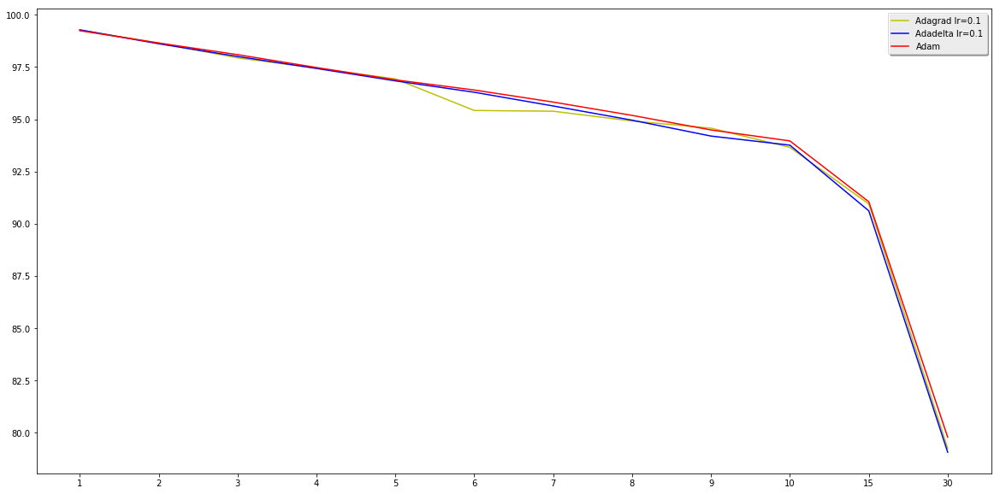

In [103]:
plt.figure(figsize=(20,10))
plot_test = plt.plot(range(af.shape[0]), af1*100, c='y', label='Adagrad lr=0.1')
plot_test = plt.plot(range(af.shape[0]), af2*100, c='b', label='Adadelta lr=0.1')
plot_test = plt.plot(range(af.shape[0]), af3*100, c='r', label='Adam')
plt.legend(loc='upper right', shadow=True)
plt.xticks(range(af.shape[0]), [1,2,3,4,5,6,7,8,9,10,15,30])
plt.savefig('corr.png')
plt.show()

In [26]:
attr={'C': [1, 2, 5, 10, 25, 50, 100],
      'gamma': [1e-2, 1e-3],
      'epsilon': [1e-8]
     }

test_attr = []
for i in range(X.shape[1]):
    svr_model = SVR()
    svr_cv = GridSearchCV(svr_model, attr, cv=5)
    svr_cv.fit(X[tuning_set - n_days_ahead:X.shape[0]-tuning_set,i].reshape(-1,1),
               X[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead,i])
    test_attr.append(svr_cv.predict(X[X.shape[0]-tuning_set:-n_days_ahead, i].reshape(-1,1)))
    print(len(test_attr[-1]))
                     

536
536
536
536
536
536
536
536
536
536


In [27]:
test_attr = np.array(test_attr)
test_attr = test_attr.transpose()

In [28]:
my_opt = Adadelta(lr=0.1) #adadelta 675 adagrad(lr=0.1) 673  --- 15 dias a frente # adagrad() -- 5 dias 395
model = Sequential()
model.add(Dense(60, activation='tanh', input_shape=(X.shape[1],)))
#model.add(Dense(100, activation='tanh'))
model.add(Dense(1))
model.compile(optimizer=my_opt, loss='mse')
model.fit(X[tuning_set:X.shape[0]-tuning_set], y[tuning_set:X.shape[0]-tuning_set], epochs=2000)


Epoch 1/2000
1630/1630 [==============================] - 0s - loss: 1.2840     
Epoch 2/2000
1630/1630 [==============================] - 0s - loss: 1.1209     
Epoch 3/2000
1630/1630 [==============================] - 0s - loss: 0.9874     
Epoch 4/2000
1630/1630 [==============================] - 0s - loss: 0.8745     
Epoch 5/2000
1630/1630 [==============================] - 0s - loss: 0.7759     
Epoch 6/2000
1630/1630 [==============================] - 0s - loss: 0.6887     
Epoch 7/2000
1630/1630 [==============================] - 0s - loss: 0.6114     
Epoch 8/2000
1630/1630 [==============================] - 0s - loss: 0.5415     
Epoch 9/2000
1630/1630 [==============================] - 0s - loss: 0.4783     
Epoch 10/2000
1630/1630 [==============================] - 0s - loss: 0.4211     
Epoch 11/2000
1630/1630 [==============================] - 0s - loss: 0.3693     
Epoch 12/2000
1630/1630 [==============================] - 0s - loss: 0.3226     
Epoch 13/2000
1630/1630 [

In [29]:
y_pred = model.predict(test_attr)

MSE = 249617.808619 - MAE = 408.188402227 - MAPE = 2.23349335424


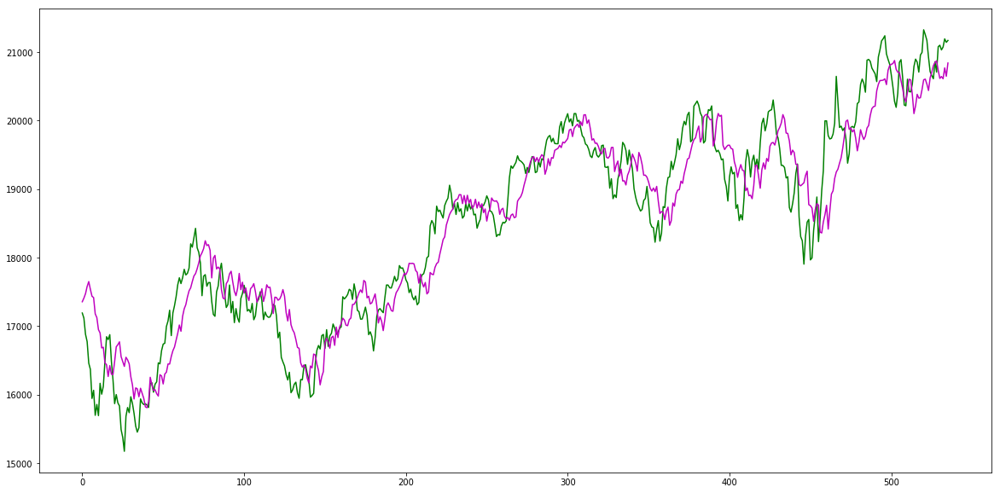

In [30]:
y_pred = sc.inverse_transform(y_pred)
y_test = sc.inverse_transform(y[(X.shape[0]-tuning_set)+n_days_ahead:])
print('MSE = ' + str(mean_squared_error(y_test, y_pred)) + ' - MAE = ' + str(mean_absolute_error(y_test, y_pred)) + 
      ' - MAPE = ' + str(mean_absolute_percentage_error(y_test, y_pred)) )

plt.figure(figsize=(20,10))
plot_test = plt.plot(range(0,y_test.shape[0]), y_test, c='g')
plot_pred = plt.plot(range(0,y_test.shape[0]), y_pred, c='m')
plt.show()

In [ ]:
y_pred = sc.inverse_transform(y_pred)
y_test = sc.inverse_transform(y[(X.shape[0]-tuning_set)+n_days_ahead:])
print('MSE = ' + str(mean_squared_error(y_test, y_pred)) + ' - MAE = ' + str(mean_absolute_error(y_test, y_pred)) + 
      ' - MAPE = ' + str(mean_absolute_percentage_error(y_test, y_pred)) )

plt.figure(figsize=(20,10))
plot_test = plt.plot(range(0,y_test.shape[0]), y_test, c='g')
plot_pred = plt.plot(range(0,y_test.shape[0]), y_pred, c='m')
plt.show()

In [12]:
#X_train, X_test = X[:tuning_train_set - n_days_ahead], X[tuning_train_set - n_days_ahead: tuning_set] #tuning set 20%
#y_train, y_test = y[n_days_ahead:tuning_train_set], y[tuning_train_set:tuning_set + n_days_ahead] #tuning set 20%

#X_train, X_test = X[tuning_train_set - n_days_ahead:X.shape[0]-tuning_set], X[X.shape[0]-tuning_set:-n_days_ahead] #treino 80% teste 20%
#y_train, y_test = y[tuning_train_set:(X.shape[0]-tuning_set)+n_days_ahead], y[(X.shape[0]-tuning_set)+n_days_ahead:]

X_train, X_test = X[tuning_set - n_days_ahead:X.shape[0]-tuning_set], X[X.shape[0]-tuning_set:-n_days_ahead] #treino 80% teste 20%
y_train, y_test = y[tuning_set:(X.shape[0]-tuning_set)+n_days_ahead], y[(X.shape[0]-tuning_set)+n_days_ahead:]

#X_train = X[tuning_train_set - n_days_ahead:-n_days_ahead]
#y_train = y[tuning_train_set:]

#X_train, X_test = X[:-n_dataset - n_days_ahead], X[-n_dataset - n_days_ahead: -n_days_ahead]
#y_train, y_test = y[n_days_ahead:-n_dataset], y[-n_dataset:]

In [20]:
#X = df.iloc[:, 6:]
X = df.values[:, 4:]
y = df.values[:, 3]
           
n_days_ahead = 1 #prever n dias a frente
#n_dataset = 100 # tamanho do teste
tuning_set = int(X.shape[0]*0.2) 
tuning_train_set = int(tuning_set*0.8)
#y_2 = y_2.reshape(-1,1)
#sc = StandardScaler()
#X = sc.fit_transform(X, y_2)
#y_2 = sc.fit_transform(y_2, X)

sc = StandardScaler()
X = sc.fit_transform(X, y.reshape(-1, 1))
y = sc.fit_transform(y.reshape(-1, 1), X)

X_train, X_test = X[:X.shape[0] - int(X.shape[0]*0.3) - n_days_ahead], X[X.shape[0] - int(X.shape[0]*0.3):-n_days_ahead]
y_train, y_test = y[n_days_ahead:X.shape[0] - int(X.shape[0]*0.3)], y[X.shape[0] - int(X.shape[0]*0.3) + n_days_ahead:]


d:\utilitarios\anaconda\envs\tensorflow\lib\site-packages\sklearn\utils\validation.py:526: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MSE = 934155.995766 - MAE = 746.234122632 - MAPE = 15.2614657467


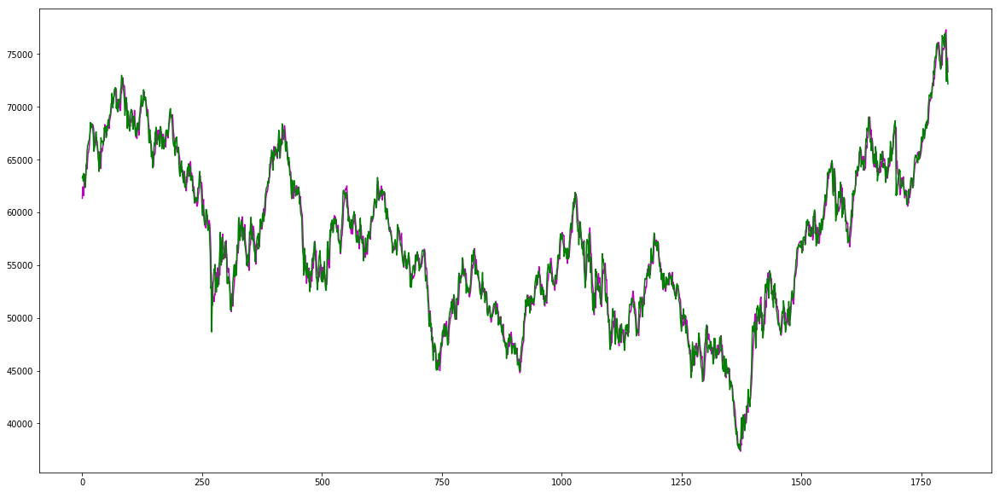

In [21]:
svr = SVR(kernel='rbf', C=10, gamma=1e-4, epsilon=1e-8) #15 gamma=1e-3
svr.fit(X_train, y_train)
y_pred = svr.predict(X_test)

y_pred = sc.inverse_transform(y_pred)
y_test = sc.inverse_transform(y_test)
print('MSE = ' + str(mean_squared_error(y_test, y_pred)) + ' - MAE = ' + str(mean_absolute_error(y_test, y_pred)) + 
      ' - MAPE = ' + str(mean_absolute_percentage_error(y_test, y_pred)) )

plt.figure(figsize=(20,10))
plot_test = plt.plot(range(0,y_test.shape[0]), y_pred, c='m')
plot_pred = plt.plot(range(0,y_test.shape[0]), y_test, c='g')
plt.show()

In [36]:
np.corrcoef(y_pred.reshape(-1,1)[:,0], y_test[:,0])

array([[ 1.        ,  0.99177771],
       [ 0.99177771,  1.        ]])

In [98]:
my_opt = Adam() #adadelta 675 adagrad(lr=0.1) 673  --- 15 dias a frente # adagrad() -- 5 dias 395
model = Sequential()
model.add(Dense(50, activation='tanh', input_shape=(X_train.shape[1],)))
model.add(Dense(50, activation='tanh'))
model.add(Dense(50, activation='tanh'))
#model.add(Dense(100, activation='tanh'))
model.add(Dense(1))
model.compile(optimizer=my_opt, loss='mse', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=1000, validation_split=0.5)
y_pred = model.predict(X_test)
print(y_pred)

Train on 2110 samples, validate on 2110 samples
Epoch 1/1000
2110/2110 [==============================] - 0s - loss: 0.2493 - acc: 0.0000e+00 - val_loss: 1.3205 - val_acc: 0.0000e+00
Epoch 2/1000
2110/2110 [==============================] - 0s - loss: 0.1291 - acc: 0.0000e+00 - val_loss: 1.3301 - val_acc: 0.0000e+00
Epoch 3/1000
2110/2110 [==============================] - 0s - loss: 0.1255 - acc: 0.0000e+00 - val_loss: 1.2728 - val_acc: 0.0000e+00
Epoch 4/1000
2110/2110 [==============================] - 0s - loss: 0.1249 - acc: 0.0000e+00 - val_loss: 1.2855 - val_acc: 0.0000e+00
Epoch 5/1000
2110/2110 [==============================] - 0s - loss: 0.1236 - acc: 0.0000e+00 - val_loss: 1.2421 - val_acc: 0.0000e+00
Epoch 6/1000
2110/2110 [==============================] - 0s - loss: 0.1225 - acc: 0.0000e+00 - val_loss: 1.2600 - val_acc: 0.0000e+00
Epoch 7/1000
2110/2110 [==============================] - 0s - loss: 0.1210 - acc: 0.0000e+00 - val_loss: 1.2208 - val_acc: 0.0000e+00
Epoch 8

In [ ]:
X_other = X[tuning_set:-n_days_ahead]
y_other = y[tuning_set+n_days_ahead:]
y_pred = model.predict(X_other)
y_pred = sc.inverse_transform(y_pred)

print(mean_squared_error(y_other, y_pred))
print(mean_absolute_error(y_other, y_pred))

plt.figure(figsize=(20,10))
plot_test = plt.plot(range(0,y_other.shape[0]), sc.inverse_transform(y_other), c='b')
plot_pred = plt.plot(range(0,y_other.shape[0]), y_pred, c='m')
plt.show()

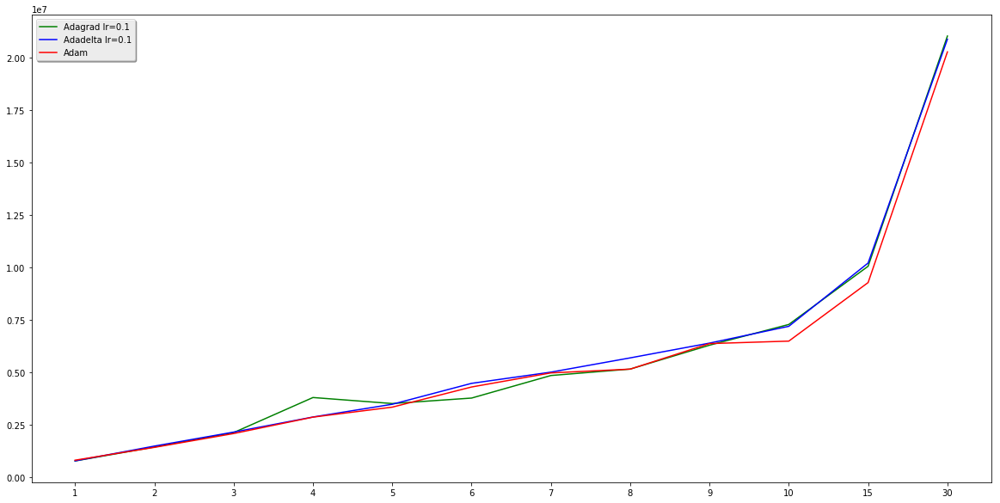

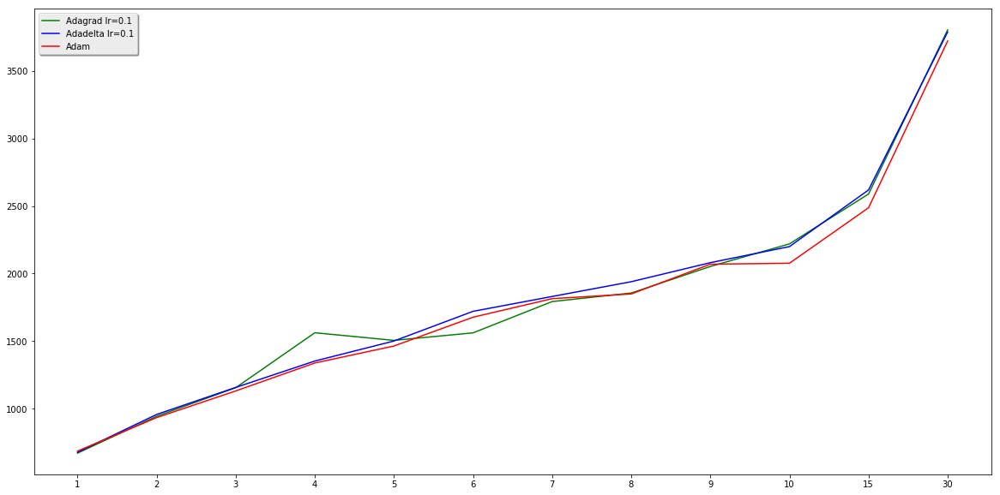

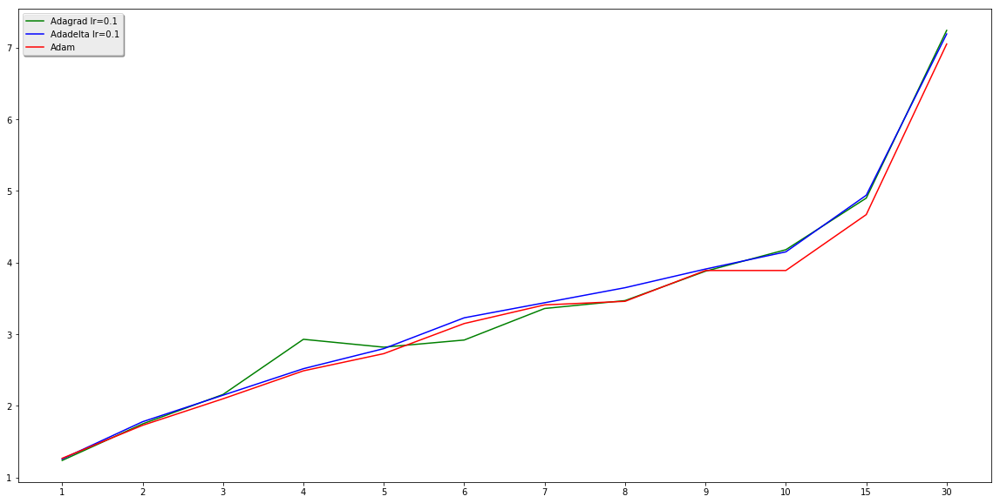

In [5]:
eqm1 = np.array([779186.89,  1442492.22, 2132382.94, 
                 3804813.77, 3518108.24, 3778815.88,
                 4854465.26, 5161593.33,  6300592.39,
                 7290101.45, 10066215.25,  21048431.58])

eqm2 = np.array([780942.16, 1488153.89, 2155214.53,
                2875320.26,  3483198.54, 4481094.89,
                5015318.36,  5695515.86, 6400121.89,
                7201866.21, 10221356.59, 20899366.09])

eqm3 = np.array([815373.37,  1426990.39,  2086844.42,
                2869559.94, 3345695.80, 4307280.36,
                4978883.83,  5159277.85,  6376832.01,
                6495520.94, 9288255.27, 20292361.50])

ema1 = np.array([671.37,  943.97,  1155.54,
                 1562.31, 1505.82, 1561.46,
                 1793.03,  1856.30,  2052.80,
                 2219.88, 2588.99,  3803.64])

ema2 = np.array([677.48,  957.54,  1157.54,
                 1352.88, 1501.02, 1720.76,
                 1830.57, 1939.98, 2080.90,
                 2199.91, 2619.24, 3788.42])

ema3 = np.array([686.44,  934.15, 1131.69,
                 1338.45,  1464.09, 1677.23,
                 1814.40, 1849.37,  2069.64,
                 2076.69, 2487.25,  3721.99])

empa1 = np.array([1.24, 1.75, 2.16,
                  2.93, 2.82, 2.92,
                  3.36, 3.47, 3.88,
                  4.18, 4.90, 7.24])

empa2 = np.array([1.26, 1.78, 2.15,
                  2.52, 2.80, 3.23,
                  3.44, 3.65, 3.91,
                  4.15, 4.94, 7.19])

empa3 = np.array([1.27, 1.73, 2.10,
                  2.49, 2.73, 3.15,
                  3.41, 3.46, 3.89,
                  3.89, 4.67, 7.05])

plt.figure(figsize=(20,10))
plot_test = plt.plot(range(eqm1.shape[0]), eqm1, c='g', label='Adagrad lr=0.1')
plot_test = plt.plot(range(eqm1.shape[0]), eqm2, c='b', label='Adadelta lr=0.1')
plot_test = plt.plot(range(eqm1.shape[0]), eqm3, c='r', label='Adam')
plt.legend(loc='upper left', shadow=True)
plt.xticks(range(eqm1.shape[0]), [1,2,3,4,5,6,7,8,9,10,15,30])
plt.savefig('eqm.png')
plt.show()

plt.figure(figsize=(20,10))
plot_test = plt.plot(range(eqm1.shape[0]), ema1, c='g', label='Adagrad lr=0.1')
plot_test = plt.plot(range(eqm1.shape[0]), ema2, c='b', label='Adadelta lr=0.1')
plot_test = plt.plot(range(eqm1.shape[0]), ema3, c='r', label='Adam')
plt.legend(loc='upper left', shadow=True)
plt.xticks(range(eqm1.shape[0]), [1,2,3,4,5,6,7,8,9,10,15,30])
plt.savefig('ema.png')
plt.show()

plt.figure(figsize=(20,10))
plot_test = plt.plot(range(eqm1.shape[0]), empa1, c='g', label='Adagrad lr=0.1')
plot_test = plt.plot(range(eqm1.shape[0]), empa2, c='b', label='Adadelta lr=0.1')
plot_test = plt.plot(range(eqm1.shape[0]), empa3, c='r', label='Adam')
plt.legend(loc='upper left', shadow=True)
plt.xticks(range(eqm1.shape[0]), [1,2,3,4,5,6,7,8,9,10,15,30])
plt.savefig('empa.png')
plt.show()

In [99]:
print(eqm1.mean(), ema1.mean(), empa1.mean())
print(eqm2.mean(), ema2.mean(), empa2.mean())
print(eqm3.mean(), ema3.mean(), empa3.mean())

5848099.93333 1809.5925 3.40416666667
5891455.7725 1818.85333333 3.41833333333
5620239.64 1770.94916667 3.32


In [2]:
eqm2 = np.array([49557.45, 92274.68, 140238.37,
                 176059.32, 213385.26, 250534.97,
                 301108.31, 335061.23, 359236.07,
                 388373.59, 545103.74, 894423.02])

eqm3 = np.array([51605.14, 91125.21, 145302.85,
                 167090.20, 207097.21, 239591.79,
                 279224.59, 315237.52, 356216.45,
                 381999.41, 532519.93, 885290.14])

#------------------------------------------------------
ema1 = np.array([162.15, 240.73, 296.38,
                 332.49, 366.28, 395.59,
                 427.76, 453.70, 478.17,
                 514.74, 605.96, 796.21])

ema2 = np.array([170.55, 242.09, 297.50,
                 336.70, 371.86, 407.47,
                 447.99, 474.72, 488.71,
                 508.51, 615.33, 785.25])

ema3 = np.array([177.83, 239.58, 306.33,
                 327.53, 370.45, 402.82,
                 429.16, 453.79, 482.19,
                 503.51, 601.50, 782.27])

#------------------------------------------------------
empa1 = np.array([0.88, 1.31, 1.62,
                  1.82, 2.00, 2.16,
                  2.33, 2.48, 2.61,
                  2.81, 3.30, 4.28])

empa2 = np.array([0.93, 1.32, 1.62,
                  1.84, 2.03, 2.23,
                  2.45, 2.60, 2.67,
                  2.77, 3.35, 4.23])

empa3 = np.array([0.96, 1.31, 1.68,
                  1.80, 2.03, 2.20,
                  2.34, 2.49, 2.62,
                  2.75, 3.26, 4.21])

In [3]:
print(ema1.mean(), empa1.mean())
print(eqm2.mean(), ema2.mean(), empa2.mean())
print(eqm3.mean(), ema3.mean(), empa3.mean())

422.513333333 2.3
312113.000833 428.89 2.33666666667
304358.37 423.08 2.30416666667
